<a href="https://colab.research.google.com/github/andreac941/ComputerVision-Eq3/blob/main/7_2_AlgorExtraccion_caracteristicas_Matching_Eq10.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **7.2 Google Colab - Algoritmos de extracción de Caraterísticas - Matching**
### **Equipo 10:**
##### Carlos Roberto Torres Ferguson - A01215432 
##### Andrea Carolina Treviño Garza - A01034993 
##### Julio Adrián Quintana Gracia - A01793661 
##### Pablo Alejandro Colunga Vázquez  - A01793671

# 9. Image Matching

## Table of Contents
1. [Libraries](#libraries)
1. [ORB Matching](#orb)
1. [SIFT Matching](#sift)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2 
import matplotlib.pyplot as plt
import numpy as np

# ORB (Oriented FAST and Rotated BRIEF) <a class="anchor" id="orb" ></a>

- Developed at OpenCV labs by Ethan Rublee, Vincent Rabaud, Kurt Konolige, and Gary R. Bradski in 2011
- Efficient and viable alternative to SIFT and SURF (patented algorithms)
- ORB is free to use
- Feature detection
- ORB builds on FAST keypoint detector + BRIEF descriptor

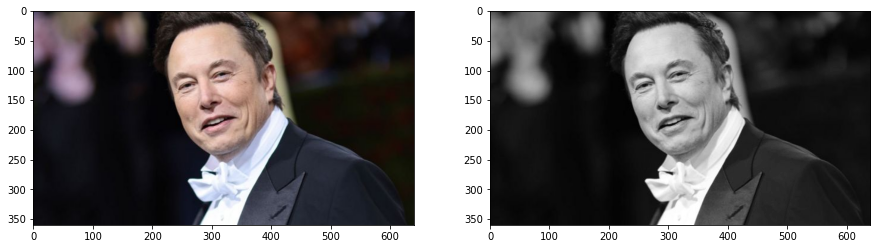

In [ ]:
#reading image
img = cv2.imread('/content/elon_1.jpg')  
img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")
plt.show()

### Create test image by adding Scale Invariance and Rotational Invariance

In [ ]:
test_image = cv2.pyrDown(img_color)
test_image = cv2.pyrDown(test_image)
num_rows, num_cols = test_image.shape[:2]

rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

### Display traning image and testing image

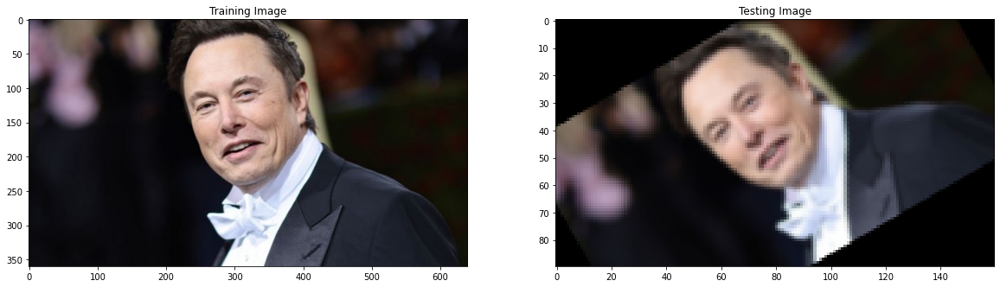

In [ ]:
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(img_color)

plots[1].set_title("Testing Image")
plots[1].imshow(test_image)
plt.show()

### ORB

In [ ]:
orb = cv2.ORB_create()

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  42


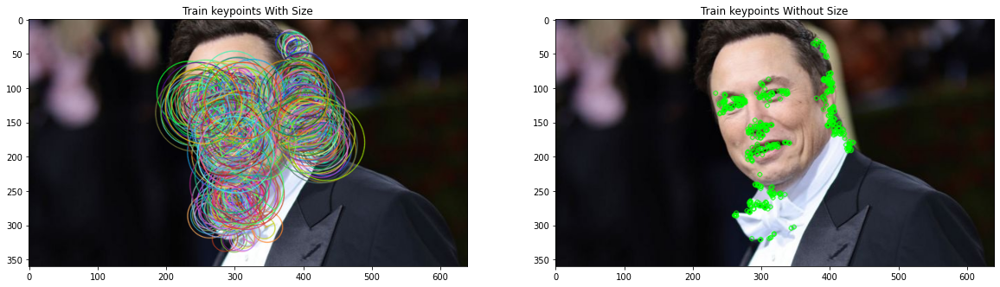

In [ ]:
train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

keypoints_without_size = np.copy(img_color)
keypoints_with_size = np.copy(img_color)

cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display image with and without keypoints size
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

# Print the number of keypoints detected in the training image
print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

# Print the number of keypoints detected in the query image
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

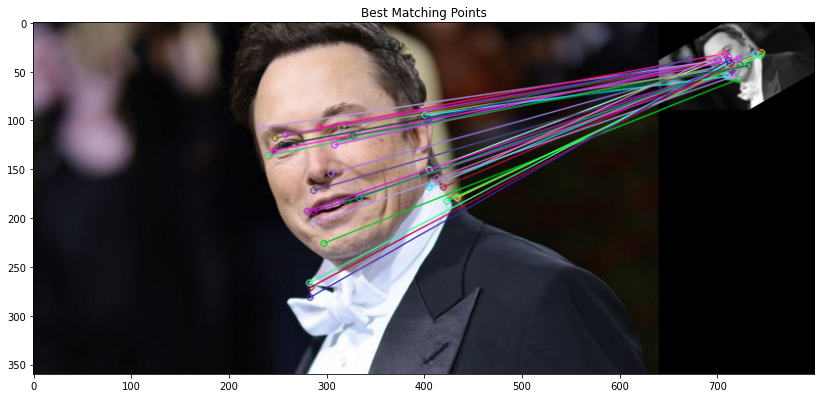


Number of Matching Keypoints Between The Training and Query Images:  30


In [ ]:
# Create a Brute Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

# Perform the matching between the ORB descriptors of the training image and the test image
matches = bf.match(train_descriptor, test_descriptor)

# The matches with shorter distance are the ones we want.
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

# Display the best matching points
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.show()

# Print total number of matching points between the training and query images
print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

## SIFT Matching (Scale Invariant Feature Transform) <a class="anchor" id="sift" ></a>

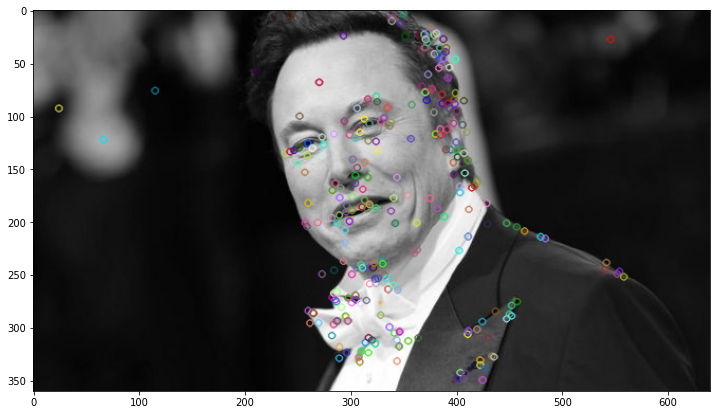

In [ ]:
img1 = cv2.imread('/content/elon_1.jpg')  
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

#keypoints
sift = cv2.SIFT_create()
keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)

img_1 = cv2.drawKeypoints(gray1,keypoints_1,img1)
plt.imshow(img_1)
plt.show()

### Matching different images

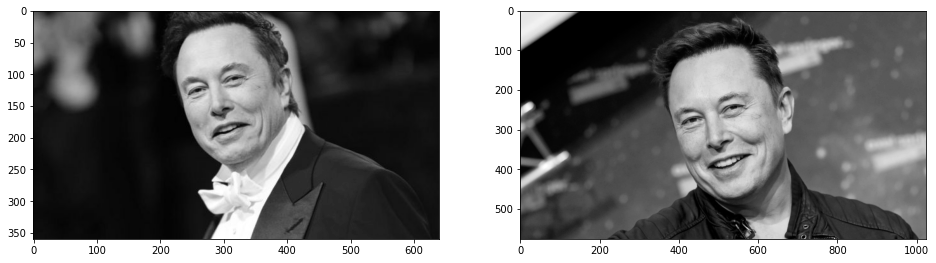

In [ ]:
# read images
img1 = cv2.imread('/content/elon_1.jpg')  
img2 = cv2.imread('/content/elon_2.png') 

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

figure, ax = plt.subplots(1, 2, figsize=(16, 8))

ax[0].imshow(img1, cmap='gray')
ax[1].imshow(img2, cmap='gray')
plt.show()

### Extracting Keypoints with SIFT

In [ ]:
#sift
sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

len(keypoints_1), len(keypoints_2)

(291, 734)

### Feature Matching

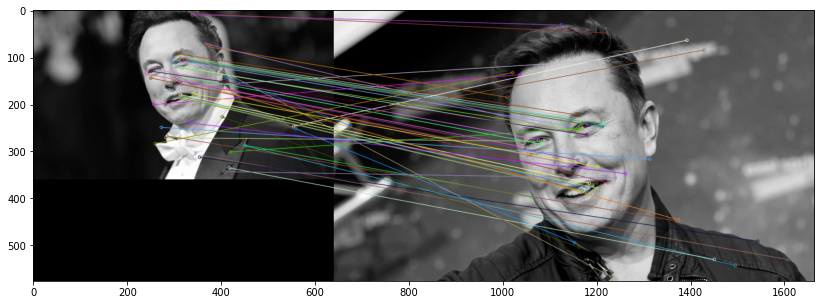

In [ ]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3)
plt.show()

#**Ejercicio**

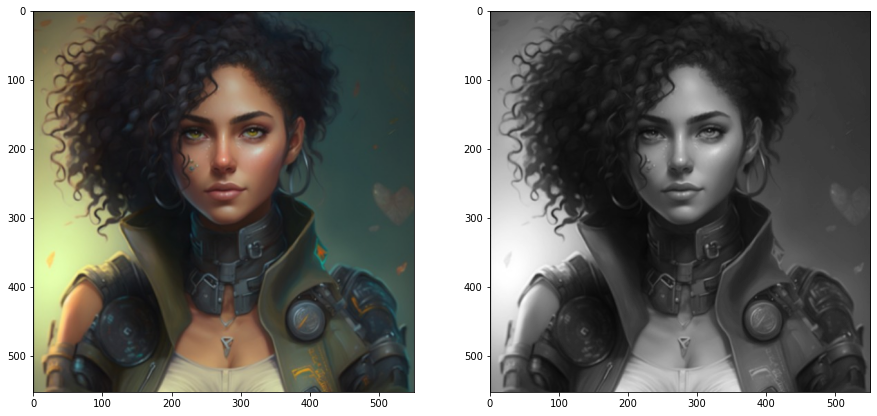

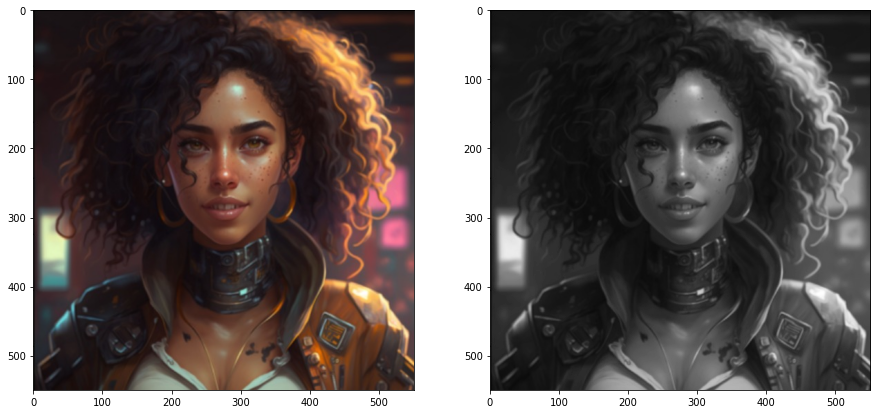

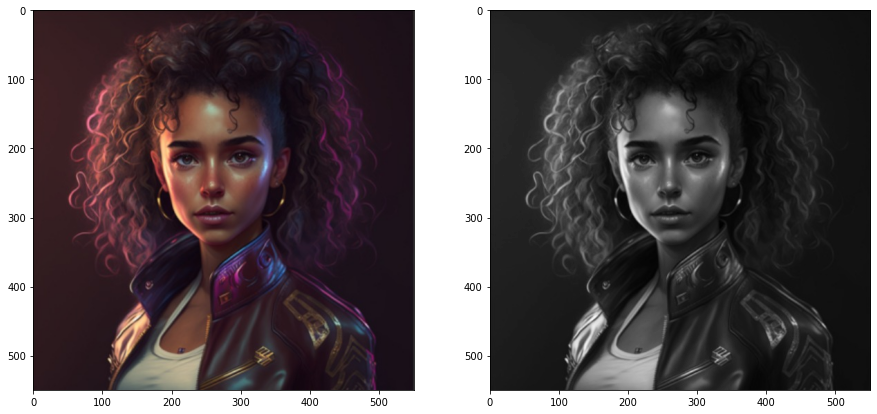

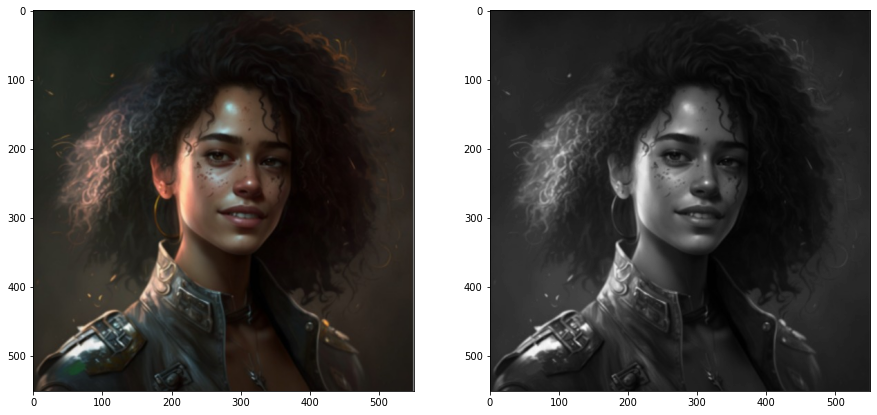

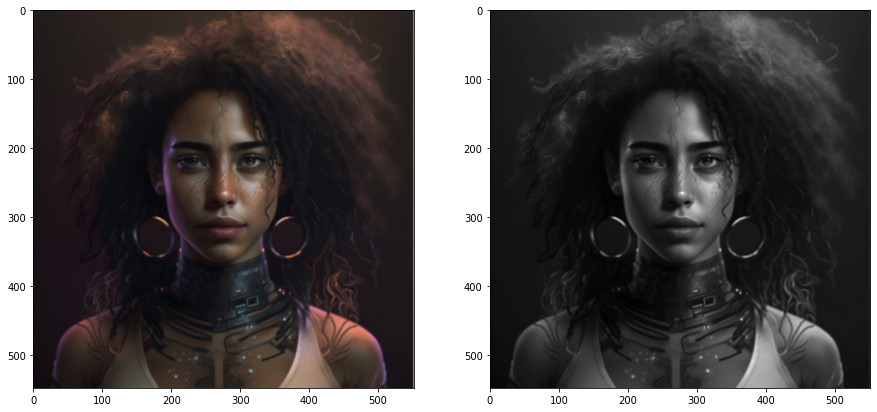

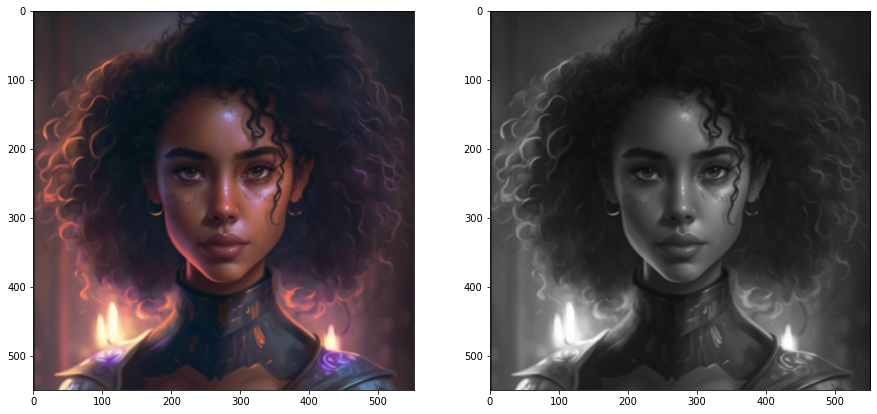

In [16]:
# img#1
img_1 = cv2.imread('/content/cv2_1.png')
img_color_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2RGB)
img_gray_1 = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color_1)
plt.subplot(1, 2, 2)
plt.imshow(img_gray_1, cmap="gray")

# img#2
img_2 = cv2.imread('/content/cv2_2.png')
img_color_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2RGB)
img_gray_2 = cv2.cvtColor(img_2, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color_2)
plt.subplot(1, 2, 2)
plt.imshow(img_gray_2, cmap="gray")

# img#3
img_3 = cv2.imread('/content/cv2_3.png')
img_color_3 = cv2.cvtColor(img_3, cv2.COLOR_BGR2RGB)
img_gray_3 = cv2.cvtColor(img_3, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color_3)
plt.subplot(1, 2, 2)
plt.imshow(img_gray_3, cmap="gray")

# img#4
img_4 = cv2.imread('/content/cv2_4.png')
img_color_4 = cv2.cvtColor(img_4, cv2.COLOR_BGR2RGB)
img_gray_4 = cv2.cvtColor(img_4, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color_4)
plt.subplot(1, 2, 2)
plt.imshow(img_gray_4, cmap="gray")

# img#5
img_5 = cv2.imread('/content/cv2_5.png')
img_color_5 = cv2.cvtColor(img_5, cv2.COLOR_BGR2RGB)
img_gray_5 = cv2.cvtColor(img_5, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color_5)
plt.subplot(1, 2, 2)
plt.imshow(img_gray_5, cmap="gray")

# img#6
img_6 = cv2.imread('/content/cv2_6.png')
img_color_6 = cv2.cvtColor(img_6, cv2.COLOR_BGR2RGB)
img_gray_6 = cv2.cvtColor(img_6, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color_6)
plt.subplot(1, 2, 2)
plt.imshow(img_gray_6, cmap="gray")

In [17]:
def orb_test(img_color):
  # Create test image by adding Scale Invariance and Rotational Invariance
  test_image = cv2.pyrDown(img_color)
  test_image = cv2.pyrDown(test_image)
  num_rows, num_cols = test_image.shape[:2]

  rotation_matrix = cv2.getRotationMatrix2D((num_cols/2, num_rows/2), 30, 1)
  test_image = cv2.warpAffine(test_image, rotation_matrix, (num_cols, num_rows))

  test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

  # Displaying training image and testing image
  fx, plots = plt.subplots(1, 2, figsize=(20,10))

  plots[0].set_title("Training Image")
  plots[0].imshow(img_color)

  plots[1].set_title("Testing Image")
  plots[1].imshow(test_image)

  orb = cv2.ORB_create()

  train_keypoints, train_descriptor = orb.detectAndCompute(img_color, None)
  test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

  keypoints_without_size = np.copy(img_color)
  keypoints_with_size = np.copy(img_color)

  cv2.drawKeypoints(img_color, train_keypoints, keypoints_without_size, color = (0, 255, 0))

  cv2.drawKeypoints(img_color, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

  # Display image with and without keypoints size
  fx, plots = plt.subplots(1, 2, figsize=(20,10))

  plots[0].set_title("Train keypoints With Size")
  plots[0].imshow(keypoints_with_size, cmap='gray')

  plots[1].set_title("Train keypoints Without Size")
  plots[1].imshow(keypoints_without_size, cmap='gray')

  # Print the number of keypoints detected in the training image
  print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))

  # Print the number of keypoints detected in the query image
  print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))
  
  # Create a Brute Force Matcher object.
  bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

  # Perform the matching between the ORB descriptors of the training image and the test image
  matches = bf.match(train_descriptor, test_descriptor)

  # The matches with shorter distance are the ones we want.
  matches = sorted(matches, key = lambda x : x.distance)

  result = cv2.drawMatches(img_color, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)

  # Display the best matching points
  plt.rcParams['figure.figsize'] = [14.0, 7.0]
  plt.title('Best Matching Points')
  plt.imshow(result)
  plt.show()

  # Print total number of matching points between the training and query images
  print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  95


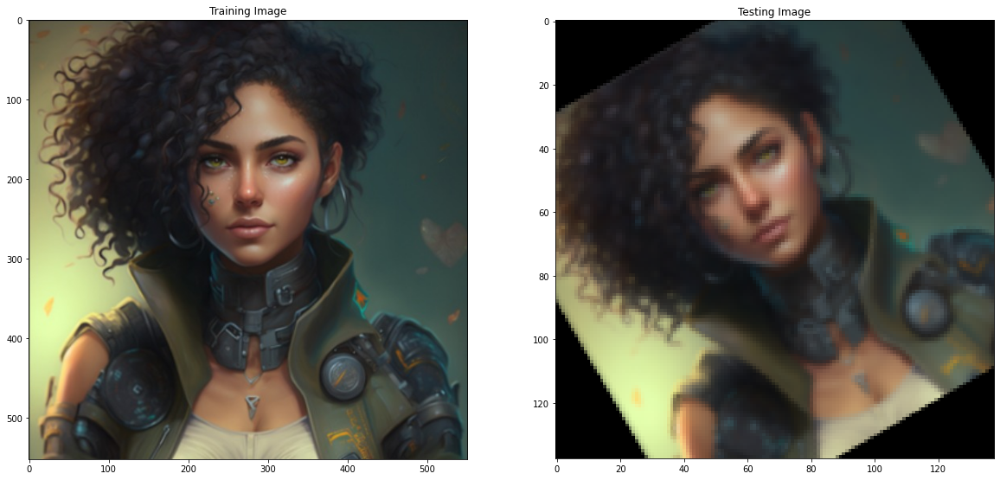

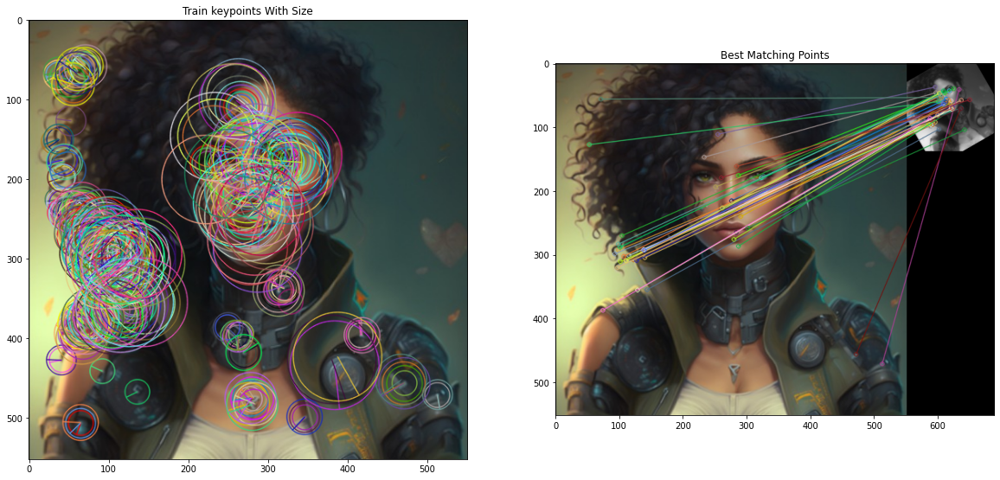


Number of Matching Keypoints Between The Training and Query Images:  45


In [18]:
orb_test(img_color_1)

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  73


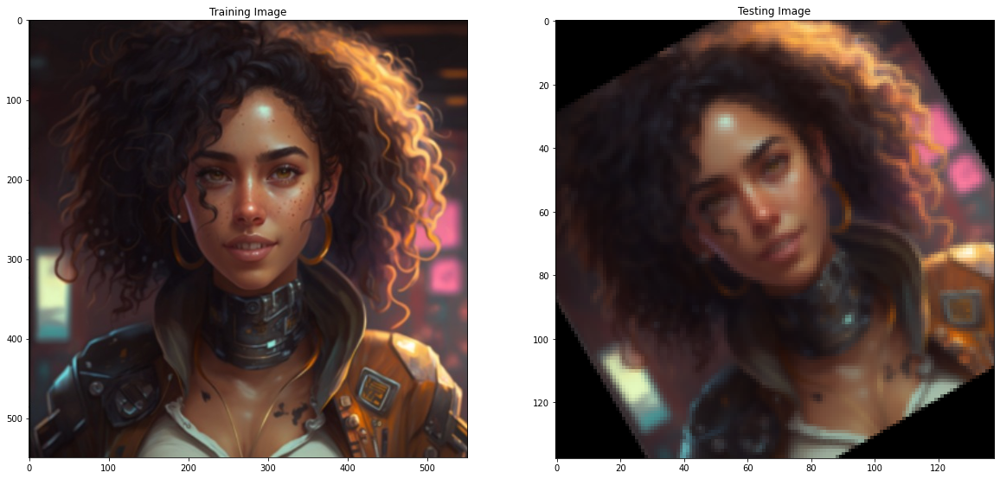

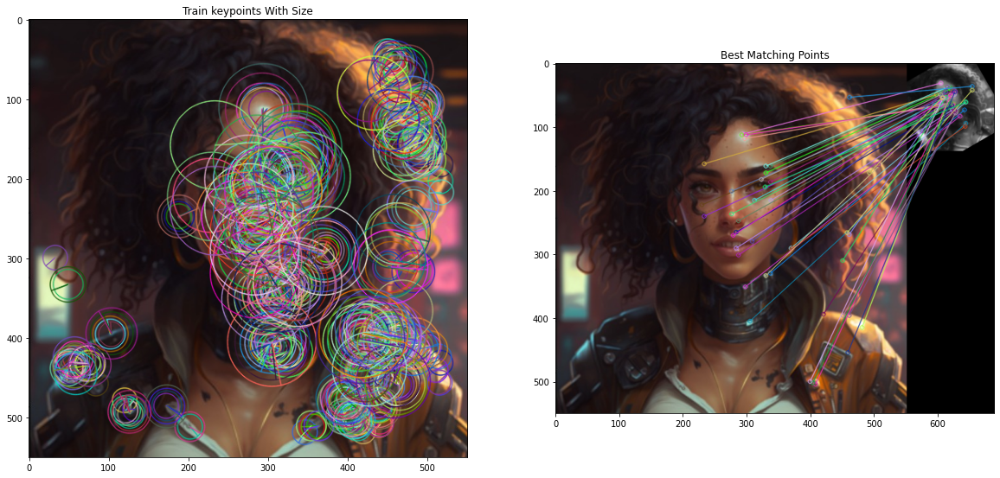


Number of Matching Keypoints Between The Training and Query Images:  44


In [19]:
orb_test(img_color_2)

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  133


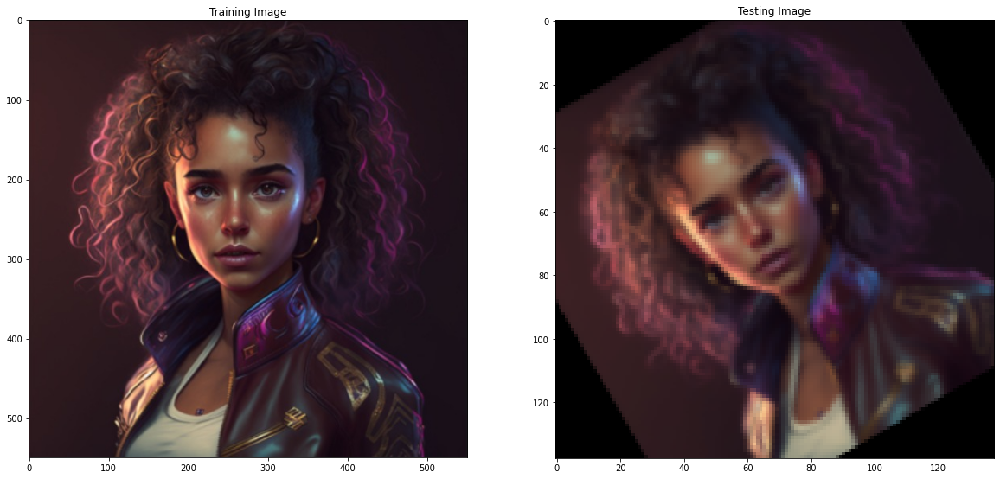

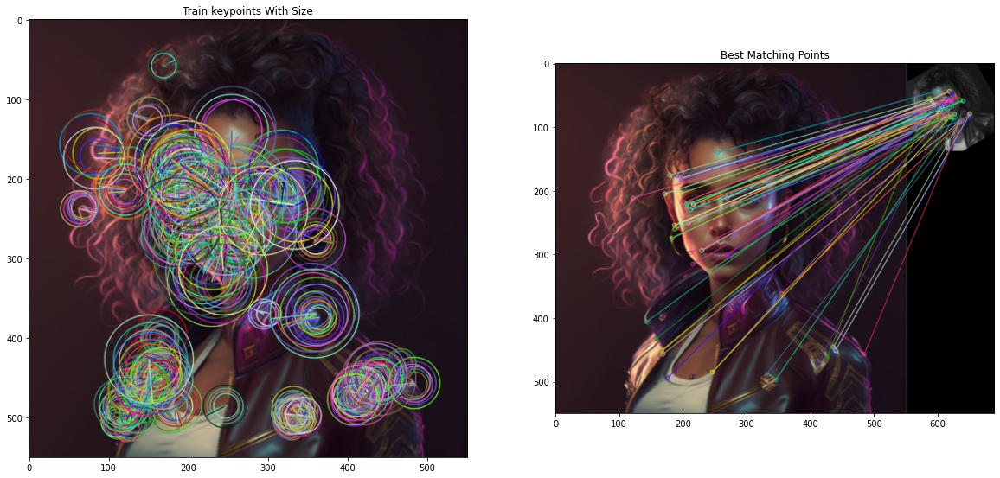


Number of Matching Keypoints Between The Training and Query Images:  56


In [20]:
orb_test(img_color_3)

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  128


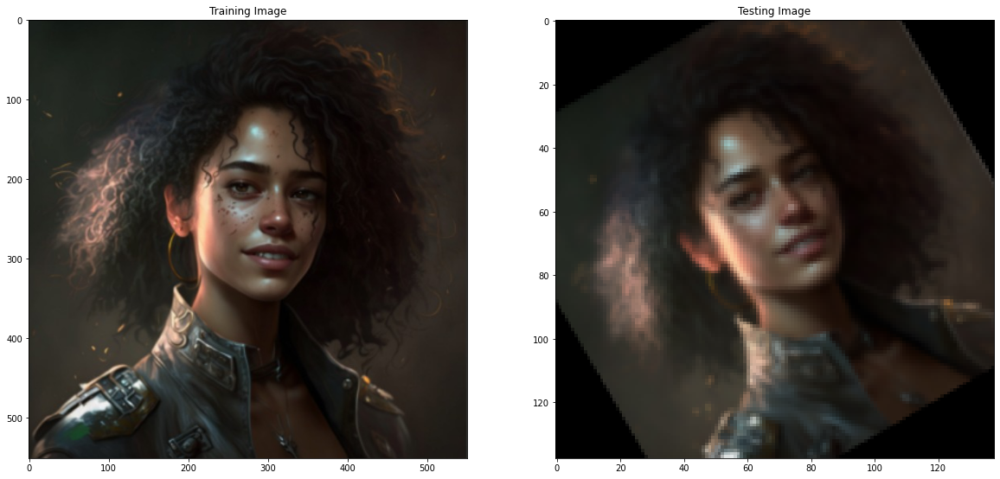

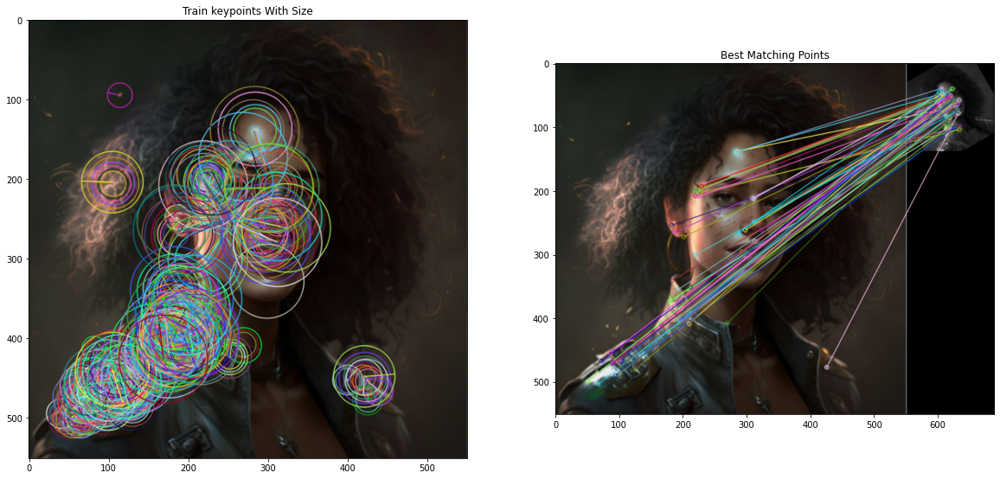


Number of Matching Keypoints Between The Training and Query Images:  63


In [21]:
orb_test(img_color_4)

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  108


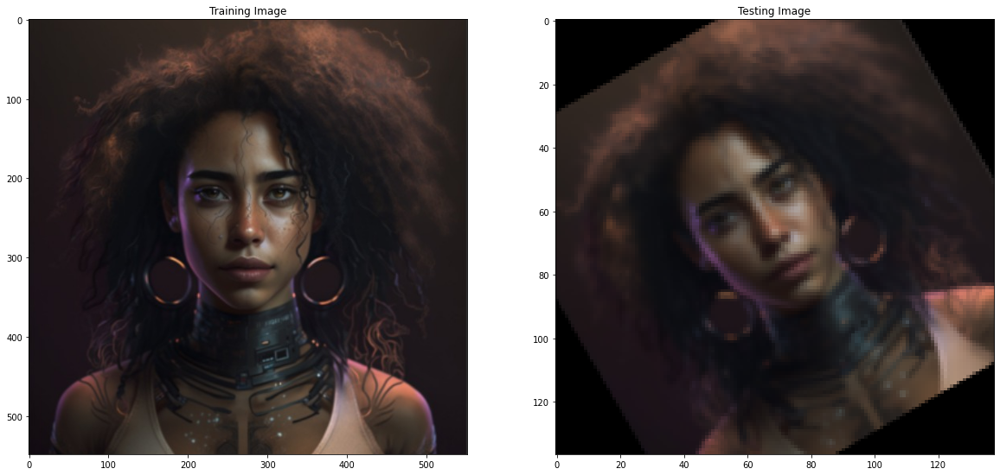

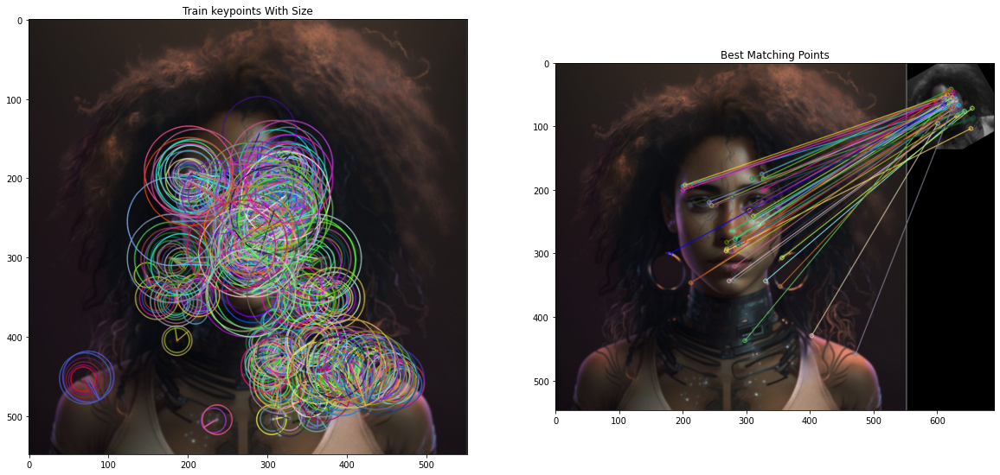


Number of Matching Keypoints Between The Training and Query Images:  52


In [22]:
orb_test(img_color_5)

Number of Keypoints Detected In The Training Image:  500
Number of Keypoints Detected In The Query Image:  107


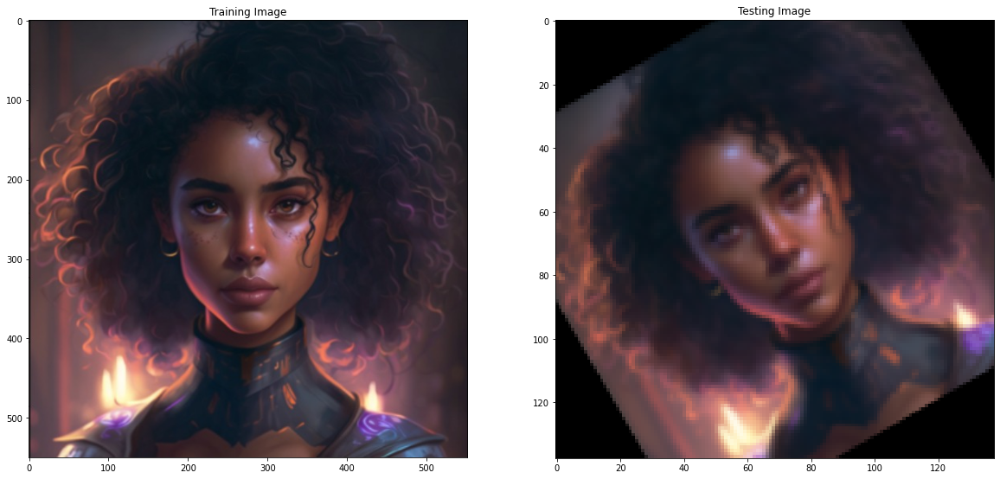

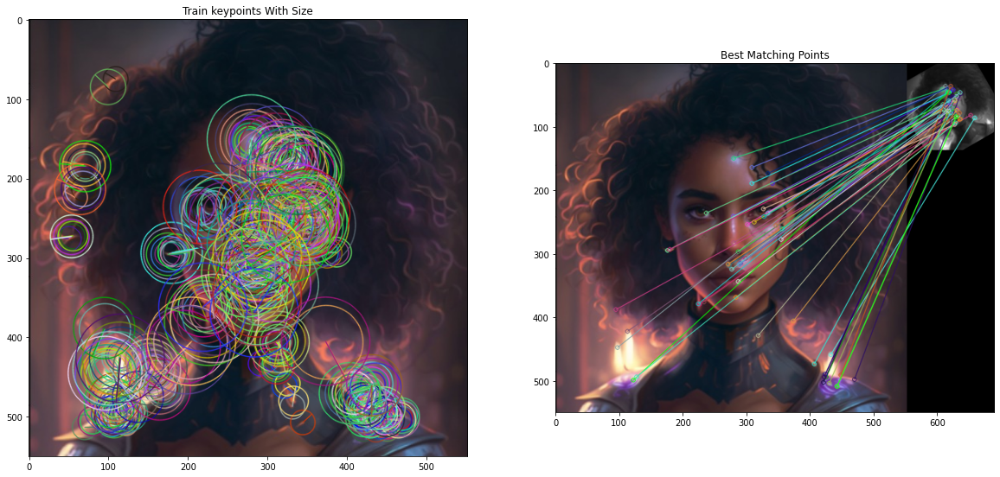


Number of Matching Keypoints Between The Training and Query Images:  49


In [23]:
orb_test(img_color_6)

En los ejemplos anteriores observamos que se tienen matches entre 43 y 62 desde el imagen de Entrenamiento (Training) y la imagen a Evaluar (Test). Al estar utilizando el CrossChek = True en la función BF.Matcher, estamos tomando los mejores Keypoints y que nos ayudan a tener un mejor resultado. 
Dichos keypoints obtenidos, hacen un correcto match aun y cuando la imagen se encuentre rotada. Desde la forma del rostro de nuestra imagen (tomando en cuenta nariz, boca, dientes, pelo), hasta las prendas que utiliza.

In [24]:
def sift_test(img1, img2):

  sift = cv2.SIFT_create()

  keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
  keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

  len(keypoints_1), len(keypoints_2)

  #feature matching
  bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True) # crossCheck utilizado para comparar con las mejores Features

  matches = bf.match(descriptors_1,descriptors_2)
  matches = sorted(matches, key = lambda x:x.distance)

  img3 = cv2.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
  plt.imshow(img3),plt.show()

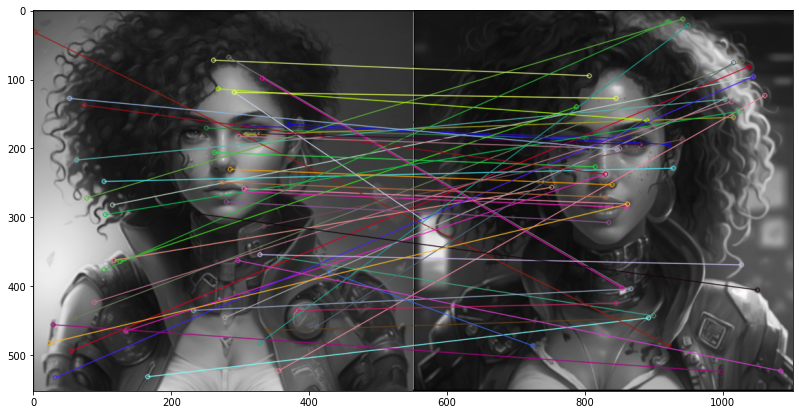

In [25]:
sift_test(img_gray_1, img_gray_2)

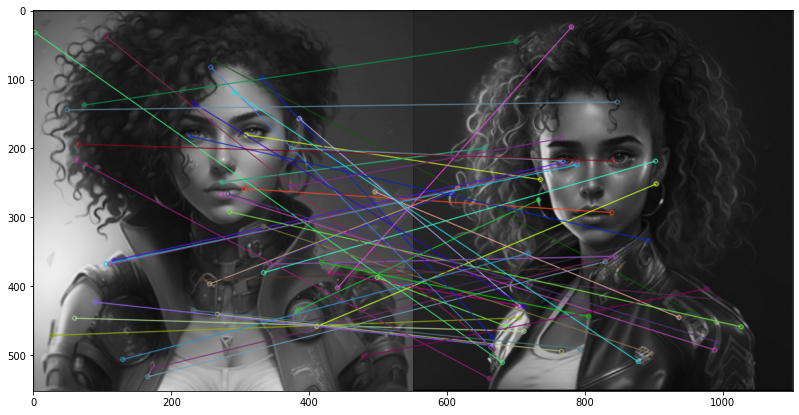

In [26]:
sift_test(img_gray_1, img_gray_3)

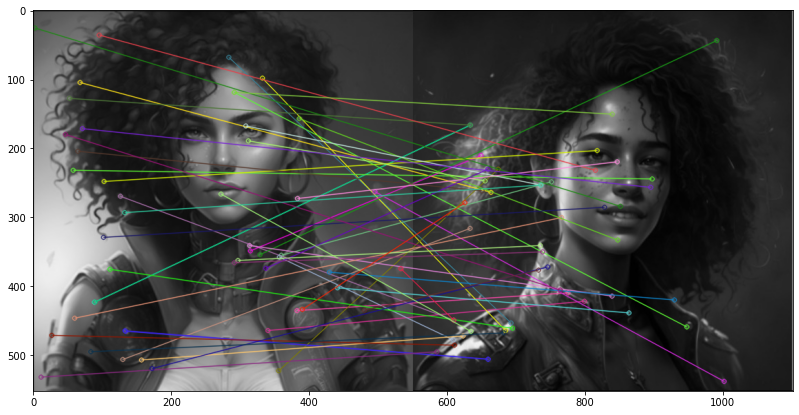

In [27]:
sift_test(img_gray_1, img_gray_4)

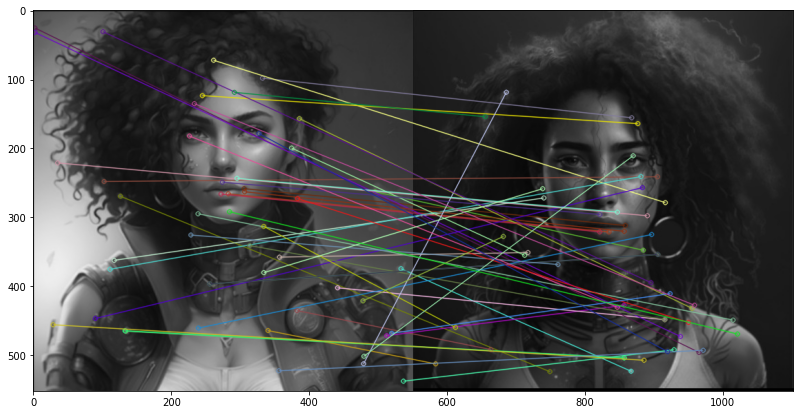

In [28]:
sift_test(img_gray_1, img_gray_5)

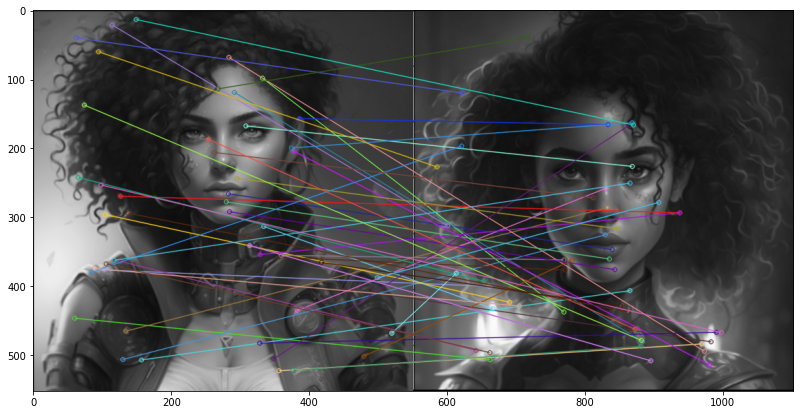

In [29]:
sift_test(img_gray_1, img_gray_6)

En los ejemplos anteriores observamos que se tienen matches entre ambas imágenes, Entrenamiento (Training) y la imagen a Evaluar (Test). 

En este ejercicio nos damos cuenta de que no es necesaria toda la información de la primer imagen para sacar las keypoint (puntos de interés) y poder hacer un match con la imagen a comparar.
Dichos keypoints van desde la forma del rostro de nuestra imagen (tomando en cuenta nariz, boca, pelo), hasta las prendas que utiliza.

#CONCLUSIÓN FINAL:

En lo que respecta al descriptor **SIFT**, observamos que la obtención de los puntos de interés se ejecutaron mas rápidamente en comparación con el descriptor ORB.

La ejecución del detector ORB fue "un poco" mas lenta que al ejecutar SIFT, investigando un poco mas del tema, encontramos que para la parte del descriptor **ORB** no se recomienda para trabajar con video en tiempo real, ya que consume mayor recurso del equipo.

En conclusión depende mucho de la aplicación con la que estemos trabajando para poder elegir alguno como el mejor descriptor, leyendo distintas citas en internet, encontramos que varios autores de decantan por uno o por otro como el mejor, para este ejercicio específico trabajó mas eficiente el SIFT, agregamos algunas referencias donde observamos algunos ejemplos en donde se hacen pruebas con ciertos ruidos, cambios de textura, etc.

##Referencias

S/A. (S/F, consulta 26/02/2023).ORB (Oriented FAST and Rotated BRIEF). Recuperado de: https://docs.opencv.org/3.4/d1/d89/tutorial_py_orb.html

Alegre E. (S/F, consulta 26/02/2023). SIFT (SCALE INVARIANT FEATURE TRANSFORM). Recuperado de: https://buleria.unileon.es/bitstream/handle/10612/11065/cap%208%20ConceptosyMetodosenVxC.pdf;jsessionid=0DA140C1715AA109E657C437F85159D8?sequence=1

Shaharyar A. (2018). A comparative analysis of SIFT, SURF, KAZE, AKAZE, ORB, and BRISK. Recuperado de: https://ieeexplore.ieee.org/document/8346440


Ebrahim K.(S/F, consulta 26/02/2023). Image Matching Using SIFT, SURF, BRIEF and ORB: Performance Comparison for Distorted Images. Recuperado de: https://arxiv.org/ftp/arxiv/papers/1710/1710.02726.pdf#:~:text=We%20showed%20that%20ORB%20is,SIFT%20show%20almost%20similar%20performances.

Ethan R. (S/F, consulta 26/02/2023) ORB: an efficient alternative to SIFT or SURF. Recuperado de: http://www.gwylab.com/download/ORB_2012.pdf
